# CNN을 활용한 이미지 분류 실습
## 이진 분류(Cats vs Dogs) & 다중 분류(포켓몬)

---

### 목차

---


- **Part 0**: 준비 단계 (환경 설정, 텐서 기초, CNN 개념)
- **Part 1**: 이진 분류 - Cats 🐱 vs Dogs 🐶
- **Part 2**: 다중 분류 - 포켓몬 분류
- **Part 3**: 비교 분석 및 정리

---

# Part 0. 준비 단계 ⚙️

## 0-1. GPU 사용 가능 여부 확인
**중요**: 런타임 → 런타임 유형 변경 → T4 GPU로 설정해주세요!

In [1]:
import torch
torch.cuda.is_available()

True

- 딥러닝에서는 학습해야 할 layer(층)이 많기 때문에, 교육세션의 회귀 분류처럼 그냥 학습하면 너무 오래 걸려요
- 그래서 학습을 빠르게 할 수 있도록 GPU를 사용해요
- GPU는 게이밍 컴퓨터에 있는건데, colab에서 무료로 사용이 가능해요

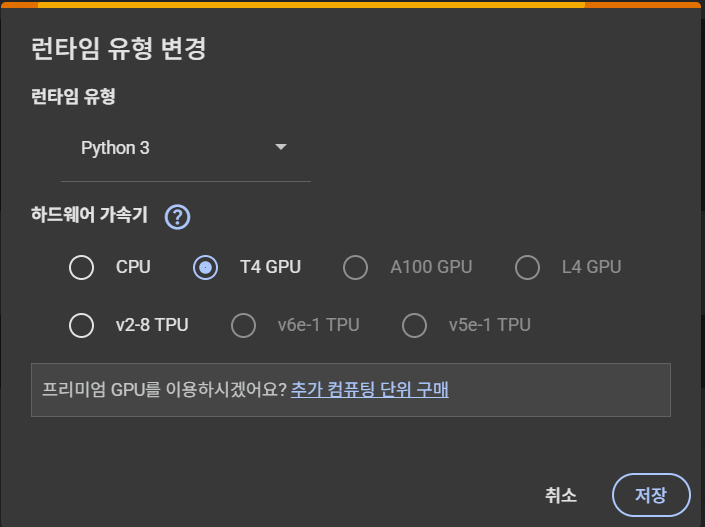

## 0-2. 구글 드라이브 연결

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


- 공유 드라이브에 자료를 넣어놨어요
- colab에 자신의 구글 계정을 연결한 후, 공유 드라이브의 자료를 가져와서 사용합니다.
- 이렇게 하면 데이터를 내 컴퓨터에 다운받지 않고도 사용이 가능합니다

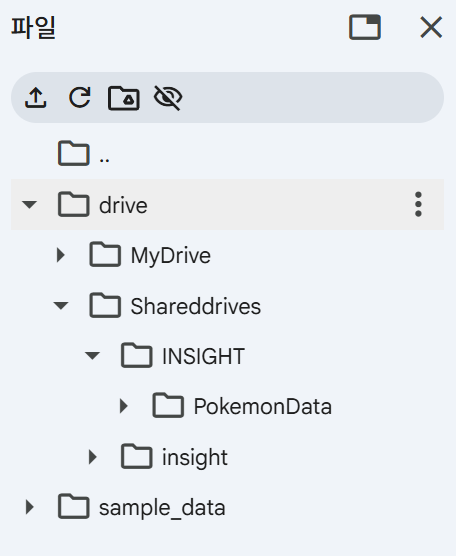

왼쪽 탭에서 파일 모양 눌렀을 때 'drive > Shareddrives > INSIGHT > PokemonData'경로의 폴더가 있으면 준비 끝!

파일 탭 설명
- MyDrive: 본인 구글 계정에 연결됩니다
- Shareddrives: 공유 드라이브 입니다.

-> 무언가를 저장하고 싶으면 MyDrive로 경로를 해야 본인 구글 드라이브에 저장됩니다. Shareddrives에 하면 안돼요

## 0-3. 텐서(Tensor) 기초 개념

딥러닝을 시작하기 전에 데이터를 표현하는 기본 구조인 **텐서**에 대해 알아봅시다.

### 딥러닝 데이터 표현과 연산

* 데이터 표현을 위한 기본 구조로 텐서(tensor)를 사용합니다.
* 텐서는 데이터를 담기위한 컨테이너(container)로서 일반적으로 수치형 데이터를 저장합니다.

---

### 텐서란?
- 텐서(Tensor)는 수학 및 물리학에서 다차원 배열을 나타내는 중요한 개념으로, 특히 딥러닝 및 머신러닝 분야에서 자주 사용됩니다.
- 텐서는 스칼라(0차원), 벡터(1차원), 행렬(2차원)의 일반화된 형태로, N차원까지 확장될 수 있습니다.


---



### 텐서의 예
텐서는 다양한 데이터 유형을 나타낼 수 있습니다.
- 이미지 데이터는 보통 3차원 텐서로 표현됩니다. (높이, 너비, 채널)
- 동영상 데이터는 시간 축이 추가된 4차원 텐서로 표현됩니다. (시간, 높이, 너비, 채널)

---

### 텐서의 연산
- 텐서 연산은 벡터와 행렬 연산을 일반화한 형태로, 덧셈, 뺄셈, 곱셈, 점곱, 전치, 역행렬 등 다양한 연산을 포함합니다.
- 딥러닝에서는 주로 선형대수 연산이 많이 사용됩니다.

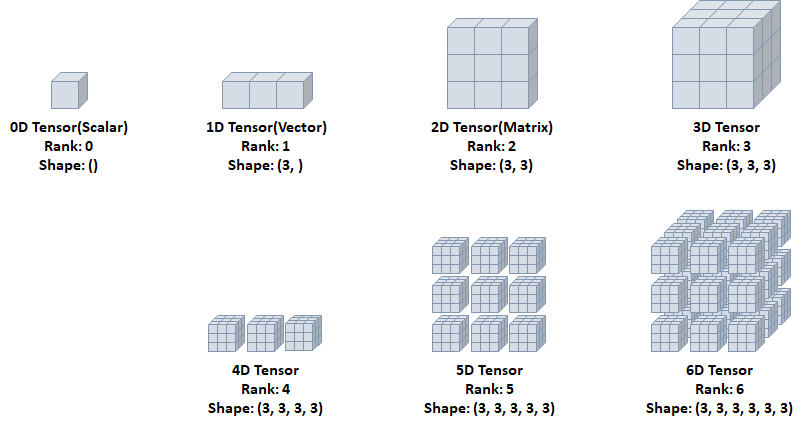

## 0-4. 라이브러리 불러오기

In [3]:
from torch import nn, optim
from torch.utils.data import DataLoader

from torchvision import datasets, transforms

from matplotlib import pyplot as plt

## 0-5. CNN(Convolutional Neural Network) 기본 개념

### CNN이란?
CNN은 이미지 처리에 특화된 딥러닝 모델입니다. 주요 구성 요소는 다음과 같습니다:

1. **Convolution Layer**: 이미지의 특징을 추출
2. **Activation Function**: 비선형성을 추가 (주로 ReLU 사용)
3. **Pooling Layer**: 특징을 압축하고 중요한 정보만 남김
4. **Fully Connected Layer**: 최종 분류 수행

### CNN의 장점
- 이미지의 공간적 정보를 유지
- 파라미터 수가 적어 효율적
- Translation invariance (이동 불변성)


---
# Part 1. 이진 분류 - Cats 🐱 vs Dogs 🐶

Microsoft의 Cats vs Dogs 데이터셋을 사용하여 이진 분류를 학습합니다.

**학습 목표**:
- CNN 모델 직접 구현하기
- 데이터 증강 기법 적용하기
- BCELoss를 사용한 이진 분류 학습


## 1-1. 데이터 준비

Hugging Face의 datasets 라이브러리를 사용하여 Cats vs Dogs 데이터를 로드합니다.

In [4]:
# Hugging Face datasets 라이브러리 설치
!pip install datasets -q

from datasets import load_dataset
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Cats vs Dogs 데이터셋 로드
print("데이터셋 로딩 중...")
dataset = load_dataset("microsoft/cats_vs_dogs")
print("데이터셋 로드 완료!")
print(dataset)

데이터셋 로딩 중...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00002.parquet:   0%|          | 0.00/330M [00:00<?, ?B/s]

data/train-00001-of-00002.parquet:   0%|          | 0.00/391M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/23410 [00:00<?, ? examples/s]

데이터셋 로드 완료!
DatasetDict({
    train: Dataset({
        features: ['image', 'labels'],
        num_rows: 23410
    })
})


### 데이터셋 구조 확인 및 분할

데이터를 Train / Validation / Test로 분할합니다.

In [5]:
# 데이터셋 분할
train_test_split = dataset['train'].train_test_split(test_size=0.2, seed=42)
train_val_split = train_test_split['train'].train_test_split(test_size=0.2, seed=42)

train_dataset = train_val_split['train']
val_dataset = train_val_split['test']
test_dataset = train_test_split['test']

print(f"Train 데이터: {len(train_dataset)}개")
print(f"Validation 데이터: {len(val_dataset)}개")
print(f"Test 데이터: {len(test_dataset)}개")

Train 데이터: 14982개
Validation 데이터: 3746개
Test 데이터: 4682개


### 데이터 시각화

데이터가 어떻게 생겼는지를 먼저 확인해야 그 이후의 학습 방향을 결정할 수 있어요
- ex1) 데이터 형태를 보니까 이미지 좌우를 뒤집는 변환은 써도 되겠다
- ex2) 데이터 형태를 보니까 이미지 색상을 바꾸는 변환은 다른 데이터와 혼동될 수 있겠다. 색상 변환은 안 해야지

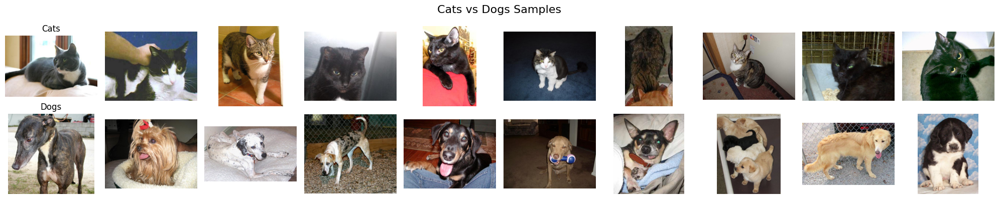

In [6]:
def visualize_samples(dataset, num_samples=10):
    cats = []
    dogs = []

    for item in dataset:
        if item['labels'] == 0 and len(cats) < num_samples:
            cats.append(item['image'])
        elif item['labels'] == 1 and len(dogs) < num_samples:
            dogs.append(item['image'])

        if len(cats) >= num_samples and len(dogs) >= num_samples:
            break

    fig, axes = plt.subplots(2, num_samples, figsize=(20, 4))
    fig.suptitle('Cats vs Dogs Samples', fontsize=16)

    for i in range(num_samples):
        axes[0, i].imshow(cats[i])
        axes[0, i].axis('off')
        if i == 0:
            axes[0, i].set_title('Cats', fontsize=12)

    for i in range(num_samples):
        axes[1, i].imshow(dogs[i])
        axes[1, i].axis('off')
        if i == 0:
            axes[1, i].set_title('Dogs', fontsize=12)

    plt.tight_layout()
    plt.show()

visualize_samples(train_dataset, num_samples=10)

### 클래스 분포 확인


=== 클래스 분포 ===
Cats (0): 7500개
Dogs (1): 7482개


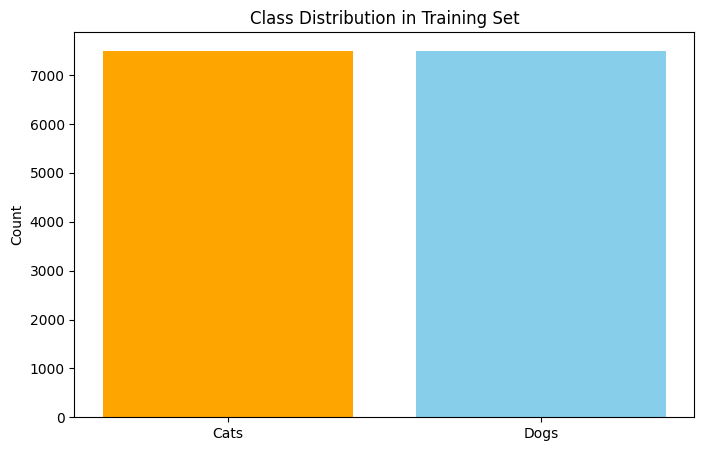

In [7]:
from collections import Counter

train_labels = [item['labels'] for item in train_dataset]
label_counts = Counter(train_labels)

print("\n=== 클래스 분포 ===")
print(f"Cats (0): {label_counts[0]}개")
print(f"Dogs (1): {label_counts[1]}개")

plt.figure(figsize=(8, 5))
plt.bar(['Cats', 'Dogs'], [label_counts[0], label_counts[1]], color=['orange', 'skyblue'])
plt.title('Class Distribution in Training Set')
plt.ylabel('Count')
plt.show()

## 1-2. 데이터 전처리 및 증강

### albumentations 라이브러리 사용
- albumentations:
  - 이미지 데이터에 다양한 증강(Augmentation) 기법을 빠르게 적용할 수 있도록 설계된 고성능 이미지 변환 라이브러리입니다.
  - PyTorch, TensorFlow와 호환 가능

### 데이터 증강 활용 이유?
- 학습하는 데이터의 형태가 다 동일하면, 모델이 과적합돼서 일반화 성능이 떨어져요
- 학습 데이터가 한 쪽으로 편향된 상황이라면 이것이 모델 성능에 치명적인 영향을 미쳐요<br>
ex) 데이터를 수집했는데,
  - 안경을 낀 사람들은 모두 "낮에 찍은 밝은 사진"
  - 안경을 끼지 않은 사람들은 모두 "밤에 찍은 어두운 사진"
  
  이 데이터셋으로 학습하면, 모델은 단순히 이미지가 밝으면 안경을 낀 사람으로, 이미지가 어두우면 안경을 끼지 않은 사람으로 분류할 수 있습니다. <br>
  -> 전체적인 데이터에 밝기 변환을 적용해서 안경을 꼈든 안 꼈든 데이터의 밝기 정보가 동일하게 맞춰주고 학습을 해야 모델이 두 이미지의 차이인 "안경"에 더 집중해서 학습하게 됩니다.

### 이미지 변환의 종류
1. 기본 전처리

- A.Resize(h, w): 이미지 전체 크기를 h x w 크기로 변환
- A.CenterCrop(h, w): 이미지 중앙을 기준으로 h x w만큼 잘라냄

2. 데이터 증강 (Data Augmentation)

- A.HorizontalFlip(p): p의 확률로 이미지를 좌우 반전
- A.Rotate(limit, p): limit(-x ~ +x)의 각도 내에서, p의 확률로 이미지 랜덤 회전

3. 색상 변환

- A.ColorJitter(brightness, contrast, saturation, hue, p): 밝기(brightness), 대비(contrast), 채도(saturation), 색조(hue)를 p의 확률로 랜덤 변환
- A.ToGray(p): p의 확률로 이미지를 흑백으로 변환

4. 정규화 (Normalization)

- A.Normalize(mean, std): 픽셀 값을 평균 mean과 표준편차 std로 정규화


### Transform 정의

In [8]:
!pip install albumentations -q

import albumentations as A # albumentations 어떻게 import 했었죠 ?
from albumentations.pytorch import ToTensorV2
import cv2

In [29]:
# albumentations를 사용하여 데이터 transform 정의
# p 값은 확률입니다. A.HorizontalFlip(p=0.5)는 50% 확률로 A.HorizontalFlip을 한다는 의미입니다.

# 공통 mean, std 값 -> 보통 이 값을 사용한다고 보시면 돼요.
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

train_transform = A.Compose([
    A.Resize(224, 224), # 256x256 크기로 변환
    A.HorizontalFlip(p=0.5), # 50% 확률로 좌우 반전하기
    A.Rotate(limit=30, p=0.5), # 50% 확률로 이미지 회전, limit=30으로 해주세요.
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5), # 50% 확률로 색상 변환. 밝기=0.2, 대비=0.2, 채도=0.2, 색조=0.1로 해주세요.
    A.ToGray(p=0.2), # 흑백으로
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)), # 정규화
    ToTensorV2()
])

val_test_transform = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

print("Transform 정의 완료")

Transform 정의 완료


### 데이터 증강 기법 살펴보기
- 실제로 이미지들이 어떻게 변하는지 눈으로 직접 확인해 봅시다!

In [30]:
sample_image = train_dataset[0]['image']
image_np = np.array(sample_image)

def visualize_augmentation(image, transform, title="Augmentation"):
    augmented = transform(image=image)['image']

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image)
    axes[0].set_title('Original')
    axes[0].axis('off')

    axes[1].imshow(augmented)
    axes[1].set_title(title)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

print("샘플 이미지 준비 완료")

샘플 이미지 준비 완료



#### Resize - 이미지 크기 변환

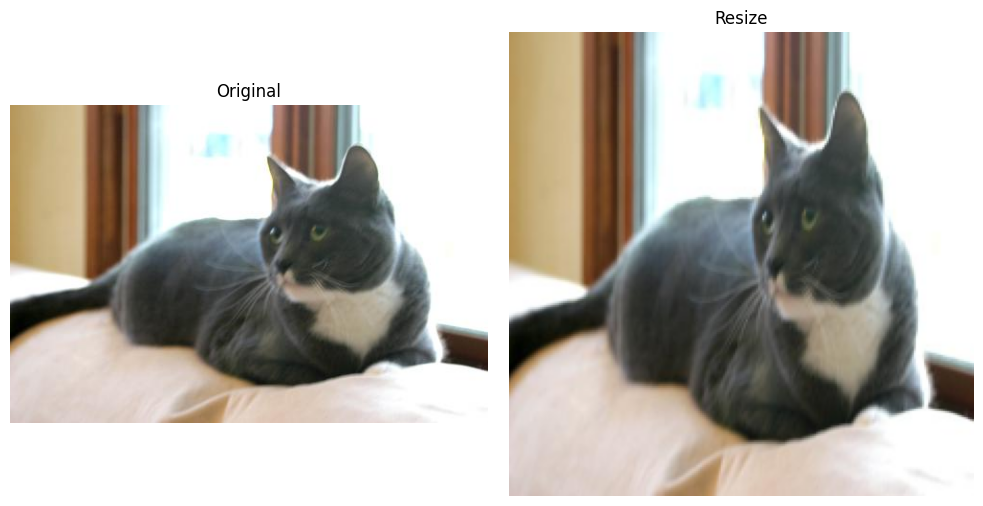

In [31]:
transform_resize = A.Compose([A.Resize(height=224, width=224)])
visualize_augmentation(image_np, transform_resize, "Resize")

### CenterCrop - 중앙자르기

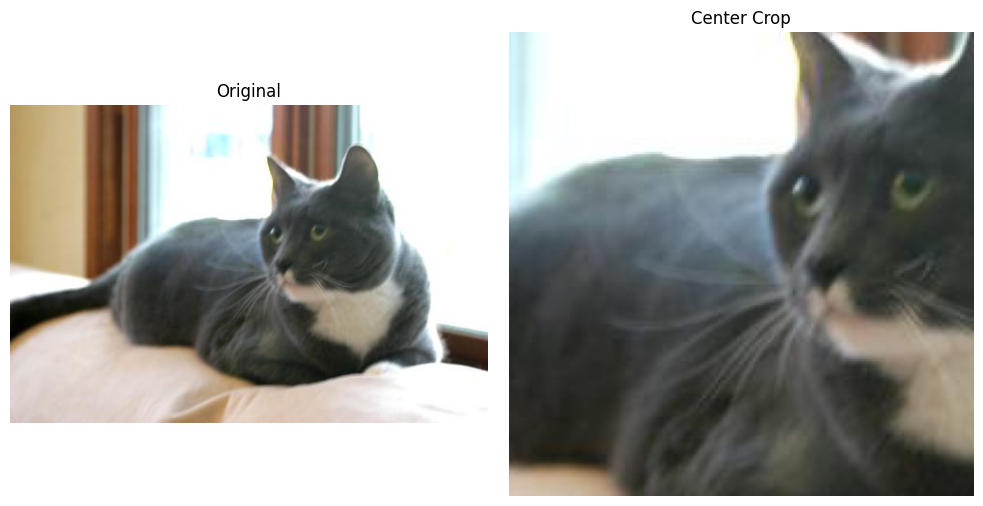

In [32]:
transform_centercrop = A.Compose([A.CenterCrop(height=200, width=200)])
visualize_augmentation(image_np, transform_centercrop, "Center Crop")

### HorizontalFlip - 좌우 반전

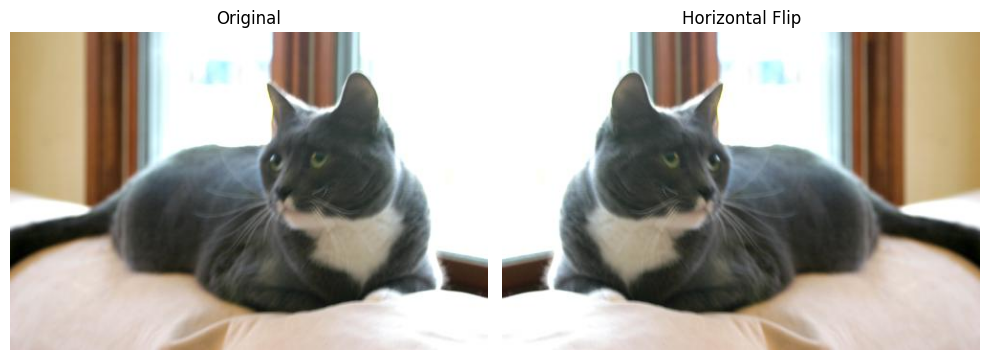

In [33]:
transform_flip = A.Compose([A.HorizontalFlip(p=1.0)])
visualize_augmentation(image_np, transform_flip, "Horizontal Flip")

### Rotate - 회전

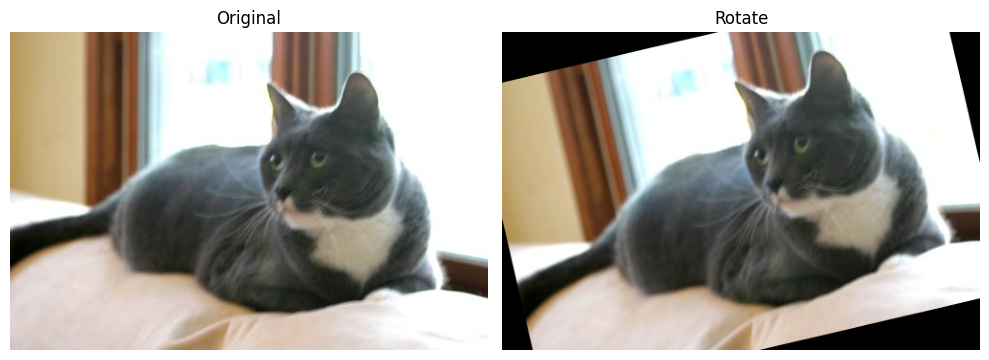

In [34]:
transform_rotate = A.Compose([A.Rotate(limit=15, p=1.0)])
visualize_augmentation(image_np, transform_rotate, "Rotate")

### ColorJitter - 밝기/대비/채도/색조 변환

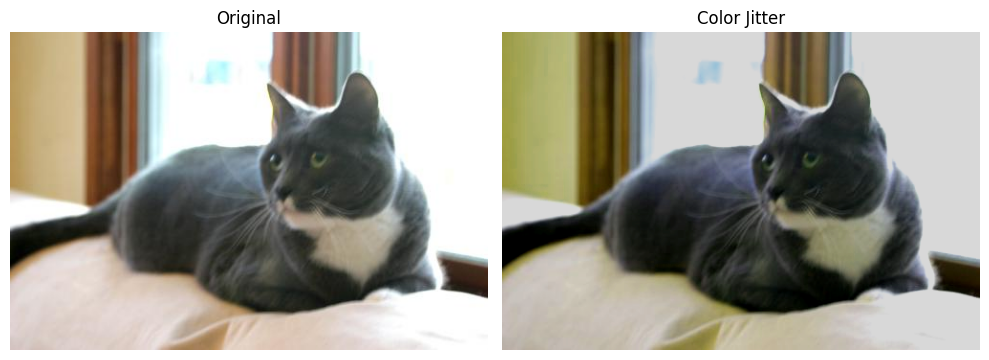

In [35]:
transform_colorjitter = A.Compose([
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1.0)
])
visualize_augmentation(image_np, transform_colorjitter, "Color Jitter")


#### ToGray - 흑백 변환


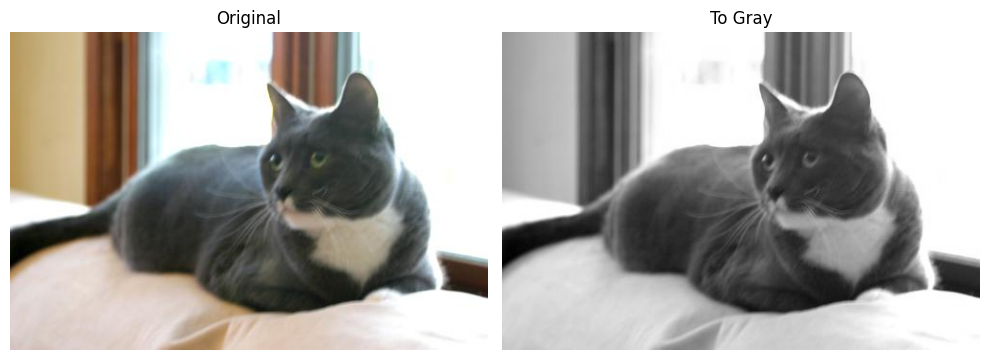

In [36]:
transform_gray = A.Compose([A.ToGray(p=1.0)])
visualize_augmentation(image_np, transform_gray, "To Gray")

### GlassBlur - 번짐 효과

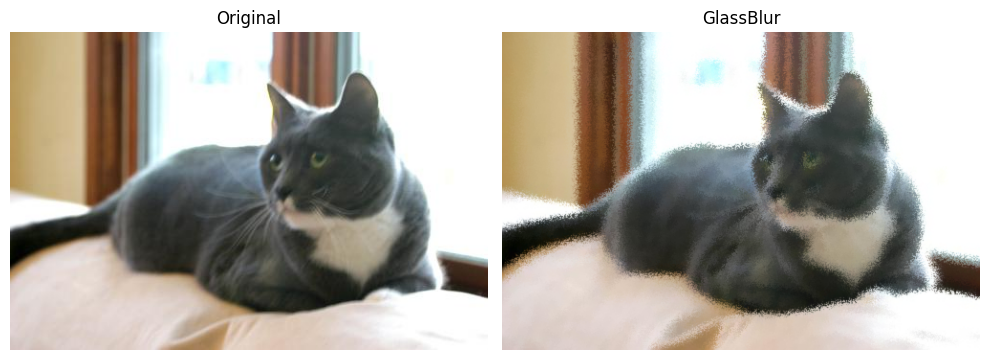

In [37]:
transform_glass = A.GlassBlur(sigma=0.5, max_delta=3, iterations=1, p=1.0)
visualize_augmentation(image_np, transform_glass, "GlassBlur")

### CoarseDropout - 얼룩진 효과

/tmp/ipython-input-214519458.py:1: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  transform_dropout = A.CoarseDropout(max_holes=5, max_height=40, max_width=40, p=1.0)


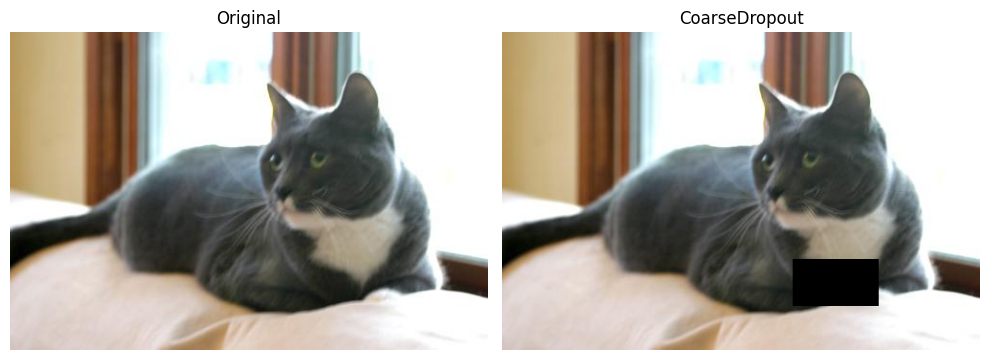

In [38]:
transform_dropout = A.CoarseDropout(max_holes=5, max_height=40, max_width=40, p=1.0)
visualize_augmentation(image_np, transform_dropout, "CoarseDropout")

### CustomDataset 정의

**Dataset**
- PyTorch에서 모든 데이터셋은 torch.utils.data.Dataset 클래스를 상속하여 정의됩니다.
- 기본적으로 __len__()과 __getitem__()을 구현해야 합니다.
- __getitem__은 하나의 데이터와 정답(label)을 반환합니다.
- Dataset을 활용하여, 전체 데이터를 한 번에 메모리에 올리지 않고, 필요할 때마다 불러옵니다
- 전처리를 유연하게 적용할 수 있습니다.

**CustomDataset**
- 위 Dataset을 직접 상속해서 나만의 데이터셋을 만드는 것입니다.
- 이미지 경로 리스트, 라벨 리스트 등을 받아서 직접 불러오고 처리할 수 있습니다

**DataLoader**
- Dataset에서 데이터를 효율적으로 반복하고, 배치(batch)로 묶어서 넘겨주는 역할을 합니다.
- shuffle, 병렬 loading, batch size 지정 등이 가능합니다

#### **Dataset과 DataLoader가 뭔지 이해하는 거 매우매우 중요 !!**

**Dataset**: (이미지, 라벨)로 세트를 만들어 놓고, 이 하나의 데이터를 불러오는 역할을 수행합니다.
- 라벨: 안경을 꼈는지 안 꼈는지를 분류할 때, {안경을 꼈다=0, 안경을 안 꼈다=1} 이렇게 정답값에 숫자를 부여한 것을 의미합니다

**DataLoader**: Dataset으로부터 여러 개(batch)의 데이터를 묶어서 전달합니다.
- 데이터 개수가 100개고 batch가 20개면, DataLoader에서는 데이터를 20개씩 묶어서 5번에 거쳐서 전달해줍니다.

In [39]:
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image # Import PIL
import numpy as np
import cv2

class CatsDogsDataset(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item['image']
        label = item['labels']

        # Convert PIL Image to numpy array and ensure RGB
        try:
            image = np.array(image.convert('RGB')) # Convert to RGB explicitly
        except Exception as e:
            print(f"Error loading or converting image at index {idx}: {e}")
            # Return a dummy image and label or skip this item
            # For simplicity, let's return a dummy image and label.
            # In a real application, you might want to log this and skip.
            dummy_image = np.zeros((224, 224, 3), dtype=np.uint8) # Assuming 224x224 as target size
            if self.transform:
                 dummy_image = self.transform(image=dummy_image)['image']
            dummy_label = torch.tensor(0, dtype=torch.float32) # Or handle based on your needs
            return dummy_image, dummy_label


        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        label = torch.tensor(label, dtype=torch.float32)

        return image, label

print("CustomDataset 정의 완료")

CustomDataset 정의 완료


### DataLoader 설정

#### Shuffle

- train은 학습할 때 꼭 shuffle을 해줘야 해요. <br>
- '앞쪽에는 강아지가 많이 나오고, 뒤에는 고양이가 많이 나오는구나'처럼 데이터의 순서를 외워버릴 수 있어요<br>
- valid와 test는 검증과 테스트용이기 때문에 순서를 유지해야 해서 shuffle=False를 해야 해요

In [40]:
train_ds = CatsDogsDataset(train_dataset, transform=train_transform)
val_ds = CatsDogsDataset(val_dataset, transform=val_test_transform)
test_ds = CatsDogsDataset(test_dataset, transform=val_test_transform)

BATCH_SIZE = 32

# shuffle ?
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print(f"Train batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")

Train batches: 469
Validation batches: 118
Test batches: 147


In [41]:
for images, labels in train_loader:
    print(f"Batch images shape: {images.shape}")
    print(f"Batch labels shape: {labels.shape}")
    print(f"Labels: {labels[:10]}")
    break

Batch images shape: torch.Size([32, 3, 224, 224])
Batch labels shape: torch.Size([32])
Labels: tensor([0., 0., 0., 1., 1., 1., 1., 0., 0., 1.])


## 1-3. CNN 모델 직접 구현

AlexNet 구조를 기반으로 이진 분류용 CNN 모델을 직접 구현합니다.

아래 이미지 실제로 개발된 AlexNet이라는 모델입니다. <br>
이 모델 구조 보시면 다음과 같이 나와 있어요
- 검은색은 이미지를 뜻합니다
- 하늘색은 kernel 크기를 나타냅니다
- 직사각형은 fully connected layer로, 그냥 값들 단순히 넘겨주는 층이라고 생각하시면 돼요

-> 이 이미지대로 실제로 모델을 직접 설계해볼게요

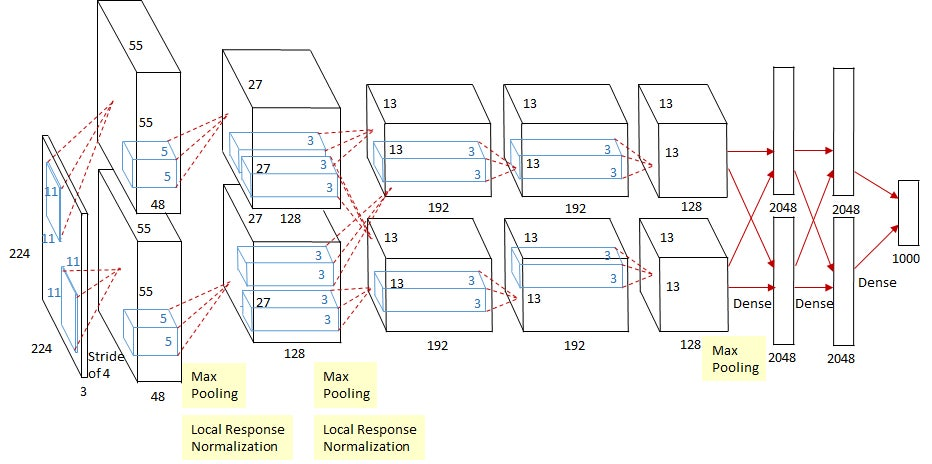

nn.Conv2d()의 결과로 생성되는 출력 이미지 크기 계산 식<br>
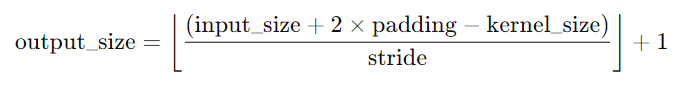

입력 이미지의 크기에 대해, 출력될 이미지의 크기를 구하는 공식은 위와 같습니다.
- input_size: 위의 예시에서 검은색 부분으로, 입력 이미지 크기는 224x224입니다.
- padding: 위의 예시에는 안 나와 있지만, padding은 2를 사용했습니다.
- kernel_size: 위의 예시에서 하늘색 부분으로, kernel_size는 11입니다.
- stride: 위의 예시에 Stride of 4라고 나와있으므로 4입니다.
- 겉을 둘러싸고 있는 거는 대괄호가 아니고 내림 연산입니다. 계산 결과 5.3이라는 값이 나오면 소숫점 다 버리고 5로 나타내는 연산이에요.

-> 계산식을 통해 출력 이미지 크기를 구하면<br>
내림( (224 + 2x2 - 11) / 4 )+1 = 내림(217/4)+1 = 내림(54.25)+1 = 54+1 = 55<br>
그래서 두 번째 직육면체에 55라고 숫자가 써 있는 거에요.
<br><br>
3과 48은 이미지의 채널 수로, 계산을 통해 나온 값이 아니고 설계할 때 지정한 값이에요

nn.MaxPool2d()의 결과로 생성되는 출력 이미지 크기 계산 식<br>
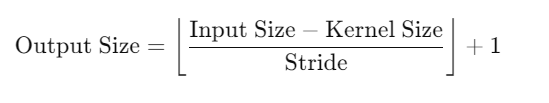

### nn.Conv2d() 파라미터 설명

```python
nn.Conv2d(in_channels=3, out_channels=64, kernel_size=11, stride=4, padding=2)
```

- **in_channels**: 입력 이미지의 채널 수 (RGB 이미지는 3)
- **out_channels**: 출력 이미지의 채널 수 (필터 개수)
- **kernel_size**: 필터 크기 (3x3, 5x5 등)
- **stride**: 점프 얼마나 할건지
- **padding**: 이미지 겉에 0의 테두리를 얼마나 추가할건지

In [42]:
import torch.nn as nn
import torch.nn.functional as F

class AlexNetBinary(nn.Module):
    def __init__(self):
        super(AlexNetBinary, self).__init__()

        # 모델 피처 설정
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )

        # 분류기 모델 생성 (모델 이미지 내 직사각형의 2048이라고 나온 부분 이후 구)
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, 1),
        )

    # 전체 과정. features() 실행 -> flatten()으로 평탄화 -> classifier() 실행
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

model = AlexNetBinary()

모델을 출력하게 되면, 앞서 구현했던 부분이 자세히 나타나게 됩니다.

In [43]:
print(model)
print(f"\n총 파라미터 수: {sum(p.numel() for p in model.parameters()):,}")

AlexNetBinary(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p

### 가중치 초기화 함수
- 앞서 만든 딥러닝 모델의 weight와 bias값을 초기화 하는 함수

가중치 초기화는 딥러닝 모델 학습의 시작점에서 매우 중요합니다. <br>
잘못된 초기화는 기울기 소실(vanishing gradient) 또는 기울기 폭발(exploding gradient) 문제를 일으킬 수 있습니다.<br> xavier_uniform 초기화는 이런 문제를 줄여주기 위해 제안된 방법입니다.

In [44]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.Linear):
            nn.init.normal_(m.weight, 0, 0.01)
            nn.init.constant_(m.bias, 0)

initialize_weights(model)
print("가중치 초기화 완료")

가중치 초기화 완료


## 1-4. 모델 학습 (BCE loss 와 Adam optimizer)

### -BCE
loss값을 찾는 방식중 하나인 BCELoss는 "Binary Cross Entropy Loss"의 약자로, **이진 분류 문제**에서 많이 사용되는 손실 함수입니다. 이 손실 함수는 모델의 출력과 실제 라벨 사이의 차이를 측정하여 모델이 얼마나 잘 학습하고 있는지를 나타냅니다.
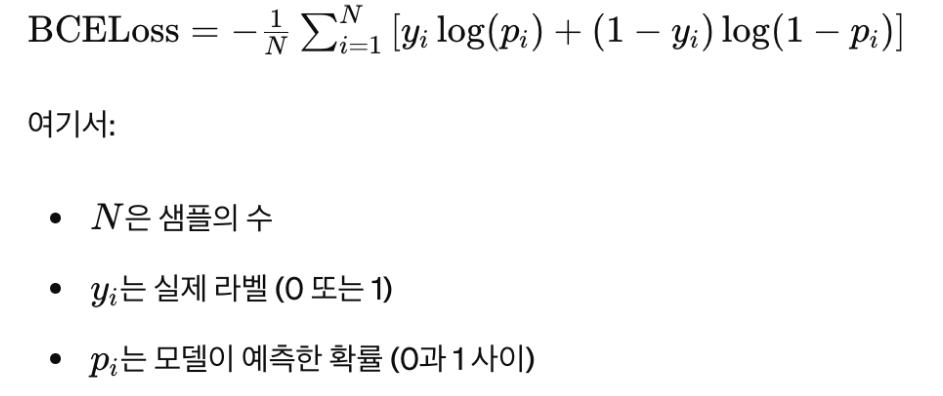

### -Adam
Adam(Adaptive Moment Estimation) 옵티마이저는 딥러닝에서 널리 사용되는 최적화 알고리즘 중 하나로, 경사 하강법(Gradient Descent) 알고리즘의 변형입니다.

In [45]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # GPU 사용하기 위해 어떻게 했었죠?
print(f"Using device: {device}")

model = model.to(device) # 모델을 GPU에 올려서 빠르게 학습시킵니다.

criterion = nn.BCEWithLogitsLoss() # 이진 분류 상황이니까 BCELoss를 사용합니다
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001) # optimizer는 그냥 Adam만 쓰면 돼요

print("Loss function: BCEWithLogitsLoss")
print("Optimizer: Adam (lr=0.0001)")

Using device: cuda
Loss function: BCEWithLogitsLoss
Optimizer: Adam (lr=0.0001)


#### **torch.device (중요!)**

- torch.cuda.is_available(): cuda, 즉 GPU를 사용 가능한지 여부를 확인하는 거에요.


- torch.cuda.is_available()이 True이면 사용 가능한 GPU가 있는 것이므로, 이 때는 "cuda"(GPU)를 device 변수에 저장하고
- torch.cuda.is_available()이 False이면, 사용 가능한 GPU가 없는 것이므로, 이 때는 "cpu"를 device 변수에 저장해서 CPU를 사용하도록 합니다

### train(), validate() 함수 정의

In [46]:
from tqdm.auto import tqdm # 선택사항, 모델의 학습 진행률을 눈으로 확인 가능
import torch
import torch.nn as nn

def train_one_epoch(model, train_loader, criterion, optimizer, device):
    model.train() # 학습 모드 설정
    running_loss = 0.0
    correct = 0
    total = 0

    # tqdm progress bar 추가
    pbar = tqdm(train_loader, desc='Training', leave=False)

    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device).unsqueeze(1)  # (batch_size, 1)

        # Forward
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward
        optimizer.zero_grad() # 이전 step에서 계산된 gradient를 모두 0으로 초기화합니다
        loss.backward()  # 역전파를 수행합니다.
        optimizer.step() # 계산된 gradient를 이용해 파라미터를 업데이트합니다.

        # Statistics
        running_loss += loss.item() * images.size(0)
        predicted = (torch.sigmoid(outputs) > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # 실시간으로 loss와 accuracy 업데이트
        current_loss = running_loss / total
        current_acc = correct / total
        pbar.set_postfix({
            'loss': f'{current_loss:.4f}',
            'acc': f'{current_acc:.4f}'
        })

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc

print("train() 함수 정의 완료")

train() 함수 정의 완료


#### train()의 핵심 내용
- model.train(): 모델을 학습 모드로 설정합니다
- optimizer.zero_grad(): 이전 step에서 계산된 gradient를 0으로 초기화합니다.<br>
  이전에 계산된 정보를 지우는 부분이에요
- loss.backward(): 역전파를 수행합니다
- optimizer.step(): 계산된 gradient를 이용해 모델의 parameter를 업데이트합니다.

In [47]:
def validate(model, val_loader, criterion, device):
    model.eval() # 평가 모드 설정
    running_loss = 0.0
    correct = 0
    total = 0

    # tqdm progress bar 추가
    pbar = tqdm(val_loader, desc='Validation', leave=False)

    with torch.no_grad():
        for images, labels in pbar:
            images = images.to(device)
            labels = labels.to(device).unsqueeze(1)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            predicted = (torch.sigmoid(outputs) > 0.5).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # 실시간으로 loss와 accuracy 업데이트
            current_loss = running_loss / total
            current_acc = correct / total
            pbar.set_postfix({
                'loss': f'{current_loss:.4f}',
                'acc': f'{current_acc:.4f}'
            })

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc

print("validate() 함수 정의 완료")

validate() 함수 정의 완료


#### validate()의 핵심 내용

- model.eval(): 모델을 평가 모드로 설정합니다. 이렇게 하면 모델을 사용해서 이미지 분류를 테스트할 수 있습니다.

### 학습 시작

### epoch 설정

- 에포크란 인공 신경망에서 **전체 데이터에 대해서 순전파와 역전파가 끝난 상태**를 말합니다.

- 예를들어 문제지의 모든 문제를 끝까지 다 풀고, 정답지로 채점을 하여 문제지에 대한 공부를 한 번 끝낸 상태를 말합니다.

- 만약 에포크가 50이라고 하면, 전체 데이터 단위로는 총 50번 학습합니다. 문제지에 비유하면 문제지를 50번 푼 셈입니다.

- 에포크 횟수가 지나치게 많거나 너무 적으면 앞서 배운 과적합과 과소적합이 발생할 수 있다.

In [48]:
NUM_EPOCHS = 20

train_losses = []
train_accs = []
val_losses = []
val_accs = []

print("학습 시작!\n")

for epoch in tqdm(range(NUM_EPOCHS), desc='Overall Progress'):
    # Train
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # Validate
    val_loss, val_acc = validate(model, val_loader, criterion, device)
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    # Epoch 결과 출력
    print(f"\nEpoch [{epoch+1}/{NUM_EPOCHS}]")
    print(f"  Train Loss: {train_loss:.4f}, Train Acc: {train_acc*100:.2f}%")
    print(f"  Val Loss: {val_loss:.4f}, Val Acc: {val_acc*100:.2f}%")

print("\n학습 완료!")

# 최종 결과 요약
print("최종 결과")
print(f"Best Train Accuracy: {max(train_accs)*100:.2f}% (Epoch {train_accs.index(max(train_accs))+1})")
print(f"Best Val Accuracy:   {max(val_accs)*100:.2f}% (Epoch {val_accs.index(max(val_accs))+1})")
print(f"Final Train Loss:    {train_losses[-1]:.4f}")
print(f"Final Val Loss:      {val_losses[-1]:.4f}")

학습 시작!



Overall Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [1/20]
  Train Loss: 0.6567, Train Acc: 60.61%
  Val Loss: 0.6851, Val Acc: 64.92%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [2/20]
  Train Loss: 0.5661, Train Acc: 70.85%
  Val Loss: 0.5518, Val Acc: 72.66%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [3/20]
  Train Loss: 0.4903, Train Acc: 76.43%
  Val Loss: 0.8115, Val Acc: 70.37%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [4/20]
  Train Loss: 0.4274, Train Acc: 80.58%
  Val Loss: 0.5536, Val Acc: 78.16%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [5/20]
  Train Loss: 0.3806, Train Acc: 82.95%
  Val Loss: 0.4422, Val Acc: 84.01%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [6/20]
  Train Loss: 0.3397, Train Acc: 84.94%
  Val Loss: 0.3883, Val Acc: 85.45%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [7/20]
  Train Loss: 0.3128, Train Acc: 86.52%
  Val Loss: 0.3319, Val Acc: 87.24%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [8/20]
  Train Loss: 0.2917, Train Acc: 87.46%
  Val Loss: 0.3138, Val Acc: 86.47%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [9/20]
  Train Loss: 0.2722, Train Acc: 88.13%
  Val Loss: 0.3505, Val Acc: 88.60%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [10/20]
  Train Loss: 0.2518, Train Acc: 89.13%
  Val Loss: 0.3121, Val Acc: 88.60%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [11/20]
  Train Loss: 0.2391, Train Acc: 89.92%
  Val Loss: 0.3239, Val Acc: 88.92%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [12/20]
  Train Loss: 0.2289, Train Acc: 90.27%
  Val Loss: 0.3112, Val Acc: 89.19%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [13/20]
  Train Loss: 0.2154, Train Acc: 91.05%
  Val Loss: 0.3025, Val Acc: 89.27%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [14/20]
  Train Loss: 0.2080, Train Acc: 91.00%
  Val Loss: 0.3087, Val Acc: 88.39%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [15/20]
  Train Loss: 0.1953, Train Acc: 91.67%
  Val Loss: 0.2923, Val Acc: 89.30%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [16/20]
  Train Loss: 0.1880, Train Acc: 92.25%
  Val Loss: 0.3417, Val Acc: 90.23%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [17/20]
  Train Loss: 0.1768, Train Acc: 92.56%
  Val Loss: 0.3205, Val Acc: 88.79%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [18/20]
  Train Loss: 0.1711, Train Acc: 92.80%
  Val Loss: 0.3437, Val Acc: 88.12%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [19/20]
  Train Loss: 0.1632, Train Acc: 93.52%
  Val Loss: 0.2658, Val Acc: 89.88%


Training:   0%|          | 0/469 [00:00<?, ?it/s]

Validation:   0%|          | 0/118 [00:00<?, ?it/s]


Epoch [20/20]
  Train Loss: 0.1527, Train Acc: 93.69%
  Val Loss: 0.3245, Val Acc: 89.48%

학습 완료!
최종 결과
Best Train Accuracy: 93.69% (Epoch 20)
Best Val Accuracy:   90.23% (Epoch 16)
Final Train Loss:    0.1527
Final Val Loss:      0.3245


## 1-5. 성능 평가 및 시각화

### Loss & Accuracy 그래프

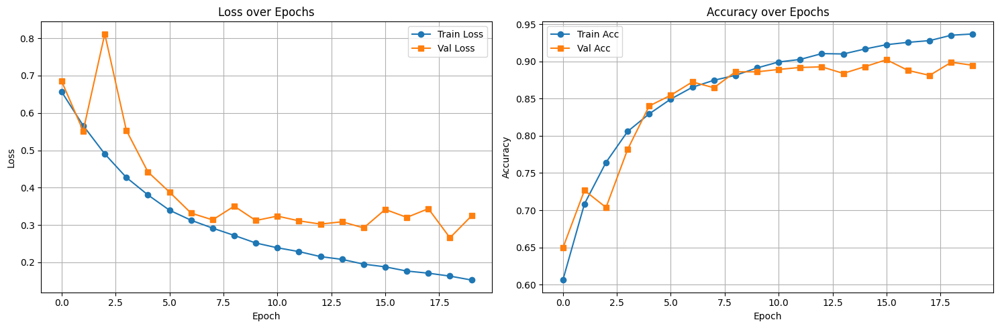

In [49]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Val Loss', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Train Acc', marker='o')
plt.plot(val_accs, label='Val Acc', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Test 데이터셋 평가

In [50]:
test_loss, test_acc = validate(model, test_loader, criterion, device)

print("Test Set 평가 결과")
print()
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

Validation:   0%|          | 0/147 [00:00<?, ?it/s]

Test Set 평가 결과

Test Loss: 0.2863
Test Accuracy: 0.9090


### 성능 지표 계산


 Classification Report
              precision    recall  f1-score   support

         Cat       0.89      0.93      0.91      2335
         Dog       0.93      0.89      0.91      2347

    accuracy                           0.91      4682
   macro avg       0.91      0.91      0.91      4682
weighted avg       0.91      0.91      0.91      4682



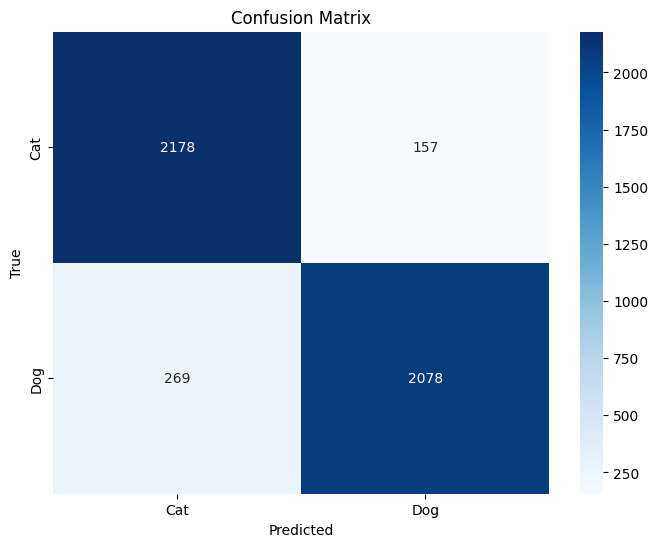

In [51]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        predicted = (torch.sigmoid(outputs) > 0.5).float().cpu().numpy()

        all_preds.extend(predicted.flatten())
        all_labels.extend(labels.numpy())

print("\n Classification Report")
print(classification_report(all_labels, all_preds, target_names=['Cat', 'Dog']))

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Cat', 'Dog'], yticklabels=['Cat', 'Dog'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### 예측 결과 시각화

In [52]:
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return tensor * std + mean

def visualize_predictions(model, test_loader, device, num_samples=10):
    model.eval()
    images_list = []
    labels_list = []
    preds_list = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            predicted = (torch.sigmoid(outputs) > 0.5).float()

            images_list.append(images.cpu())
            labels_list.append(labels)
            preds_list.append(predicted.cpu())

            if len(images_list) * images.size(0) >= num_samples:
                break

    images = torch.cat(images_list)[:num_samples]
    labels = torch.cat(labels_list)[:num_samples]
    preds = torch.cat(preds_list)[:num_samples]

    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    axes = axes.flatten()

    class_names = ['Cat', 'Dog']

    for idx in range(num_samples):
        img = denormalize(images[idx])
        img = img.permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)

        true_label = int(labels[idx].item())
        pred_label = int(preds[idx].item())

        axes[idx].imshow(img)
        axes[idx].axis('off')

        color = 'green' if true_label == pred_label else 'red'
        axes[idx].set_title(f'True: {class_names[true_label]}\nPred: {class_names[pred_label]}',
                           color=color, fontsize=10)

    plt.tight_layout()
    plt.show()

visualize_predictions(model, test_loader, device, num_samples=10)

Output hidden; open in https://colab.research.google.com to view.

#### 마무리 멘트 😀

train()과 validate() 함수, 그리고 테스트 데이터로 모델을 평가하는 코드는
상황별로 매번 새로 구현할 필요가 없습니다.<br>
이미 구현한 train()과 validate()가 기본 틀이 되며, 데이터가 바뀌어도 전체 구조는 그대로 사용하면 됩니다.<br>

지금까지는 이진 분류를 다루었지만, 다중 클래스 분류로 바뀌더라도 마찬가지입니다.<br>
이 경우 손실함수만 BCELoss에서 CrossEntropyLoss로 바꾸면 되고,
train()과 validate() 함수 자체는 이진 분류 때와 거의 동일하게 사용할 수 있습니다.<br>


이제 다중 분류로 넘어가 보아요 ~ 🚀

---
# Part 2. 다중 분류 - 포켓몬 분류
- 귀여운 포켓몬들을 CNN 모델을 활용해 분류해 봅시다.

**학습 목표**:
- 사전 학습된 모델 (Transfer Learning) 활용하기
- CrossEntropyLoss를 사용한 다중 분류 학습
- Confusion Matrix로 클래스별 성능 분석


## 2-1. 데이터 준비

### 공유 드라이브의 PokemonData 폴더에서 메타몽 10개만 시각화해보기
- 데이터가 어떻게 생겼는지를 시각적으로 확인함으로써 전처리 필요성이나 학습의 방향을 결정할 수 있어요
- ex) 포켓몬들의 색깔이 다르면 다른 포켓몬으로 구분된다면, 데이터에 색상 변환은 수행하면 안되겠죠. <br>
train, valid, test에 대해 10개의 이미지 시각화해볼게요

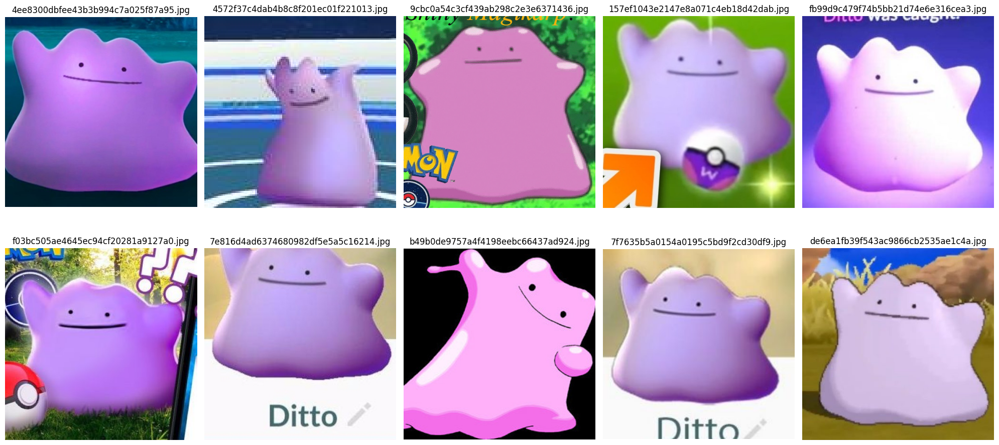

In [53]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# 폴더 경로
folder_path = '/content/drive/Shareddrives/INSIGHT/PokemonData/data/Ditto'

# 폴더 내 모든 파일 목록
file_list = os.listdir(folder_path)

# 이미지 파일만 필터링 (jpg, png 확장자만 포함)
image_files = [f for f in file_list if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# 10장 무작위 선택
sample_files = random.sample(image_files, min(10, len(image_files)))

# 시각화
plt.figure(figsize=(20, 10))
for i, file_name in enumerate(sample_files):
    img_path = os.path.join(folder_path, file_name)
    img = Image.open(img_path)
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(file_name)
plt.tight_layout()
plt.show()

## 2-2. 데이터 전처리

### 특정 이미지에 대해 변형 전과 후 비교

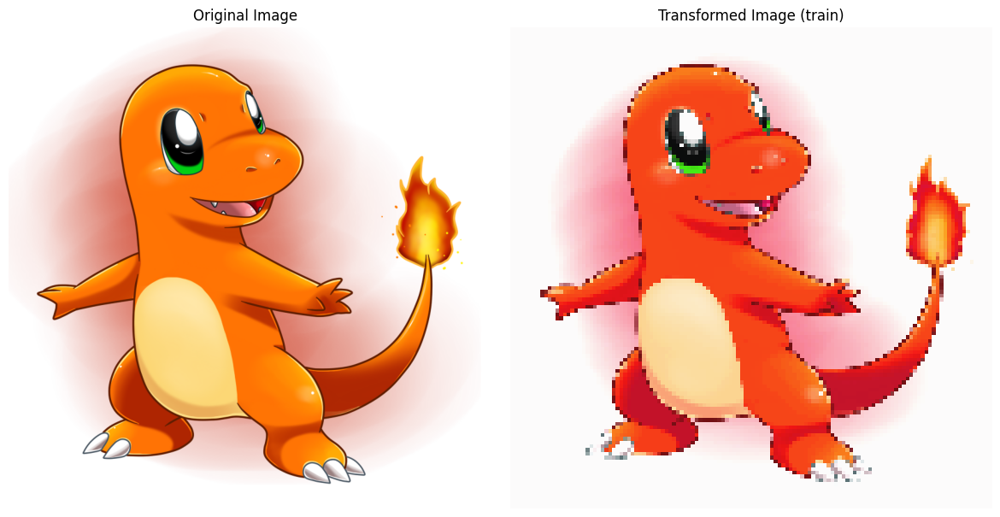

In [54]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import albumentations as A # albumentations 어떻게 import 했었죠?
from albumentations.pytorch import ToTensorV2
import torch

# transform 정의
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

transform = A.Compose([
    A.Resize(128, 128), # 크기 변환하고 싶어요
    A.HorizontalFlip(p=0.5),  # 좌우 반전하고 싶어요
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1.0),# 색상 변환하고 싶어요
    A.Normalize(mean=mean, std=std), # 정규화하고 싶어요
    ToTensorV2()
])

# 이미지 경로
img_path = "/content/drive/Shareddrives/INSIGHT/PokemonData/data/Charmander/00000020.png"

# 원본 이미지 읽기 (RGB)
orig_img = cv2.imread(img_path)
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# 변형 적용
transformed = transform(image=orig_img)
transformed_tensor = transformed["image"]

# unnormalize 함수 정의 -> normalize 했으니까, 다시 unnormalize해서 시각화
def unnormalize(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

# tensor를 numpy로 변환
unnorm_img = unnormalize(transformed_tensor.clone(), mean, std)
unnorm_img = unnorm_img.permute(1, 2, 0).cpu().numpy()

# 시각화: 원본과 변형 후 비교
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(orig_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(unnorm_img)
plt.title("Transformed Image (train)")
plt.axis("off")

plt.tight_layout()
plt.show()


  ![image.png](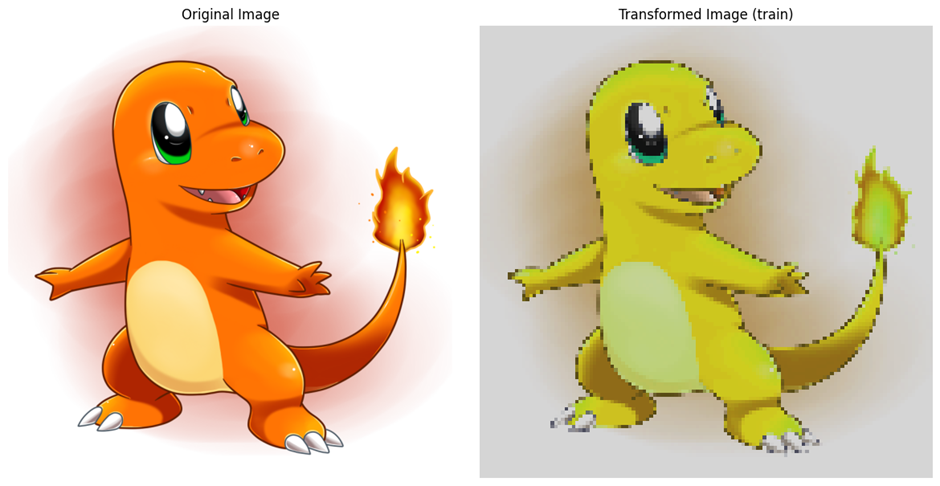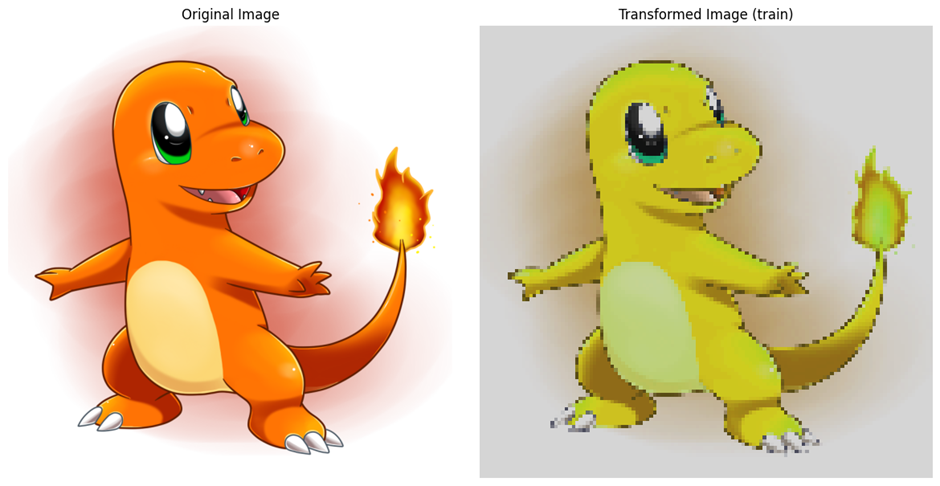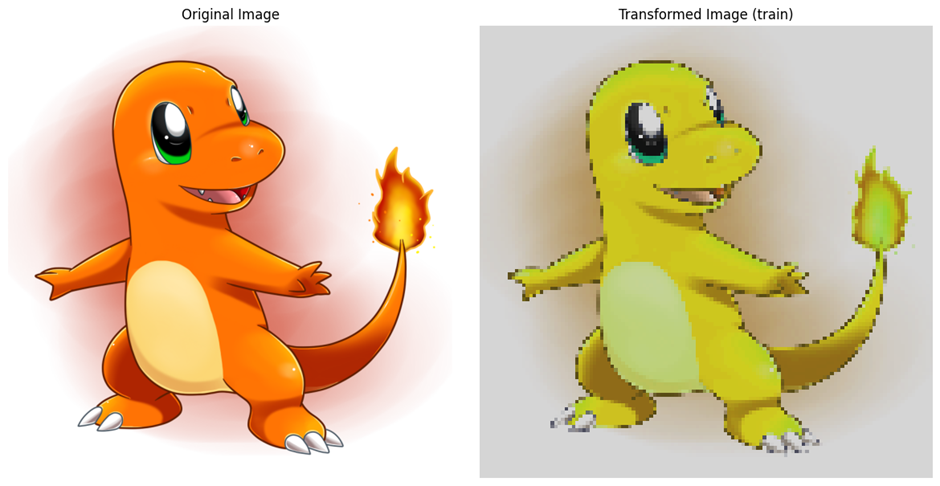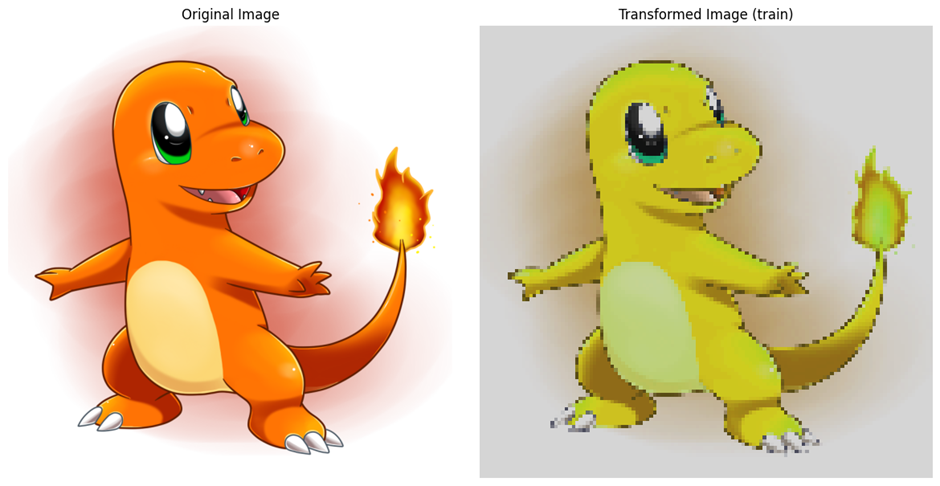)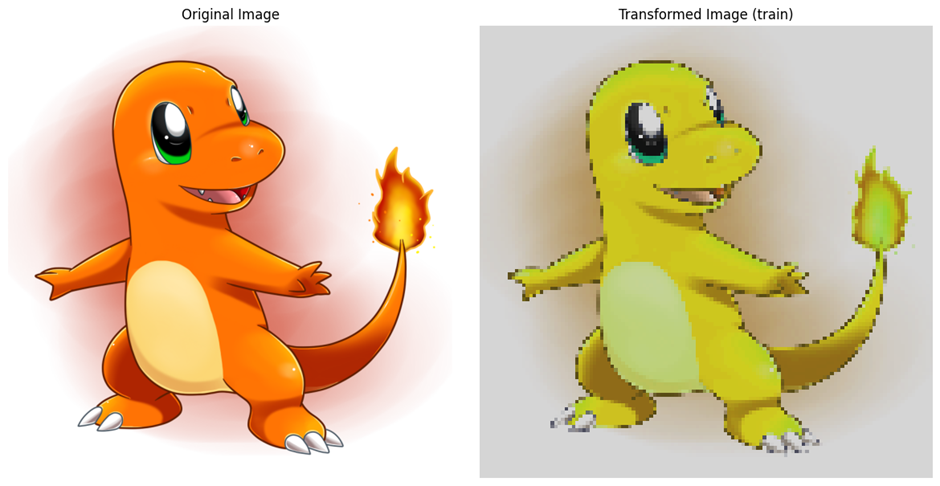

(무작위로 변형하는 거라서 첨부해놓은 이미지와 결과 달라질 수 있어요.) <br>


**💡 insight**<br>
색상을 바꾸는 변환은 잘못하면 포켓몬 종류를 바꿀 수도 있을 것 같다!

-> ColorJitter 변환은 사용하지 않는 것이 좋을 것 같다

### 데이터 transform
- Resize: 어떤 사전학습 모델을 사용하느냐에 따라, 각 모델이 원하는 입력 이미지의 크기대로 Resize 해줍니다
- Normalize: 사전학습 모델이 학습할 때 사용된 mean과 std로 이미지를 정규화해줍니다. 정규화를 하게 되면 경사하강법이 더 잘 작동해서 학습이 안정화됩니다.
- HorizontalFlip: 이미지의 좌우를 반전시킵니다.

-> train은 크기 조정, 좌우 반전, 정규화 수행, valid와 test는 크기 조정, 정규화만 수행<br>
-> valid와 test는 검증/테스트용 데이터이기 때문에 좌우 반전이나 색상을 변환시키지 않고 원래의 데이터로 유지합니다.

In [55]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

# 공통 mean, std 값 -> 보통 이 값을 사용한다고 보시면 돼요.
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# albumentations를 사용하여 데이터 transform 정의
pk_train_transform = A.Compose([
    A.Resize(224, 224), # 크기 변환하고 싶어요
    A.HorizontalFlip(p=0.5), # 좌우 반전하고 싶어요
    A.Normalize(mean=mean, std=std), # 정규화하고 싶어요
    ToTensorV2()
])
pk_test_transform = A.Compose([
    A.Resize(224, 224), # 크기 변환하고 싶어요
    A.Normalize(mean=mean, std=std), # 정규화하고 싶어요
    ToTensorV2()
])

## Dataset과 Dataloader, CustomDataset의 정의

### **한 번 더 강조 !! (중요)**
**Dataset**
- dataset은 데이터를 정의하는 클래스입니다.
- 데이터를 한 번에 메모리에 올리지 않고, 필요할 때마다 불러옵니다.
- 전처리를 유연하게 적용할 수 있습니다.

**CustomDataset**
- CustomDataset을 PokemonDataset이라는 이름으로 정의했습니다
- init, len, getitem의 형식으로 사용합니다.
- 직접 다 구현하는게 아니고, 정해진 customdataset 형식에서 class_to_idx 같은 부분만 상황에 맞게 수정해서 사용해요

- CustomDataset을 사용해야 하는 경우
  - 여러 class의 이미지가 train, valid, test 각 폴더에 모두 모여있는 경우
  - albumentations를 사용하는 경우
  
**Dataloader**
- dataloader는 데이터를 효율적으로 반복하고, 배치(batch)로 묶어서 넘겨주는 역할을 합니다.
- dataloader의 역할
  - 배치(batch) 단위로 데이터를 나눠서 불러옵니다
  - 데이터를 섞습니다(shuffle)
  - 병렬로 빠르게 로딩할 수 있습니다 (num_workers)
  - epoch 단위로 반복 가능하게 해줍니다



In [56]:
from torch.utils.data import Dataset, DataLoader
from glob import glob

class PokemonDataset(Dataset):
    def __init__(self, root_dir, transform=None, class_to_idx=None):
        self.img_paths = []
        self.labels = []
        self.transform = transform

        # 파일 목록 수집
        image_files = [f for f in os.listdir(root_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # 전달받은 class_to_idx 사용
        self.class_to_idx = class_to_idx

        # 이미지 및 레이블 수집
        for f in image_files:
            class_name = f.split("_")[0]
            if class_name not in self.class_to_idx:
                print(f"{f} → 클래스 '{class_name}'가 class_to_idx에 없음")
                continue

            label = self.class_to_idx[class_name]
            self.img_paths.append(os.path.join(root_dir, f))
            self.labels.append(label)

        print(f"{root_dir}에서 {len(self.img_paths)}개의 이미지가 로드되었습니다.")

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        label = torch.tensor(self.labels[idx], dtype=torch.long)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image=image)['image']

        return image, label


**이것도 다시 한 번 강조 !! (중요)**<br>
- train은 학습할 때 꼭 shuffle을 해줘야 해요. <br>
- '앞쪽에는 Abra의 포켓몬이 많이 나오고, 뒤에는 Zubat의 포켓몬이 많이 나오는구나'처럼 데이터의 순서를 외워버릴 수 있어요<br>
valid와 test는 검증과 테스트용이기 때문에 순서를 유지해야 해서 shuffle=False를 해야 해요

In [57]:
data_root = "/content/drive/Shareddrives/INSIGHT/PokemonData"

# 클래스 인덱스 추출
train_path = os.path.join(data_root, 'train')
train_image_files = glob(os.path.join(train_path, "*.jpg"))

# 파일명에서 클래스명(포켓몬 이름) 추출 (예: 'Abra_abc123.jpg' → 'Abra')
class_names = sorted({os.path.basename(f).split("_")[0] for f in train_image_files})
class_to_idx = {cls_name: idx for idx, cls_name in enumerate(class_names)}

# train, valid, test 경로 설정
train_path = os.path.join(data_root, 'train')
valid_path = os.path.join(data_root, 'valid')
test_path  = os.path.join(data_root, 'test')

# Dataset
train_dataset = PokemonDataset(train_path, transform=pk_train_transform, class_to_idx=class_to_idx)
valid_dataset = PokemonDataset(valid_path, transform=pk_test_transform, class_to_idx=class_to_idx)
test_dataset  = PokemonDataset(test_path,  transform=pk_test_transform, class_to_idx=class_to_idx)

# Dataloader
# batch_size=16, num_workers=2로 하고, shuffle은 상황에 맞게 지정해서 DataLoader 완성해주세요
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True,  num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=2)

/content/drive/Shareddrives/INSIGHT/PokemonData/train에서 2373개의 이미지가 로드되었습니다.
/content/drive/Shareddrives/INSIGHT/PokemonData/valid에서 630개의 이미지가 로드되었습니다.
/content/drive/Shareddrives/INSIGHT/PokemonData/test에서 378개의 이미지가 로드되었습니다.


위의 코드에서 class_to_idx는 Abra, Ditto와 같은 CLASS 이름을 0, 1, 2, ...의 label로 나타내는 과정입니다

## 2-3. 사전 학습 모델 활용 (Transfer Learning)

### 전이학습(Transfer Learning)이란?

**전이학습**은 대규모 데이터셋(예: ImageNet)으로 사전 학습된 모델을 활용하여 새로운 문제를 해결하는 기법입니다.

#### 장점:
1. **적은 데이터로도 높은 성능**: 이미 학습된 특징 추출 능력 활용
2. **빠른 학습**: 처음부터 학습하는 것보다 훨씬 빠름
3. **더 나은 일반화**: 다양한 이미지 특징을 이미 학습함

#### 두 가지 접근 방법:
1. **Feature Extraction**: 사전 학습된 레이어는 고정, 마지막 레이어만 학습
2. **Fine-tuning**: 전체 또는 일부 레이어를 함께 학습


### 모델 준비 (ResNet18)

In [58]:
import torchvision.models as models

model_pretrained = models.resnet18(pretrained=True)

num_classes = len(class_to_idx)
model_pretrained.fc = nn.Linear(model_pretrained.fc.in_features, num_classes)

model_pretrained = model_pretrained.to(device)

print(f"모델: ResNet18 (사전 학습)")
print(f"클래스 수: {num_classes}")
print(f"총 파라미터: {sum(p.numel() for p in model_pretrained.parameters()):,}")

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 139MB/s]

모델: ResNet18 (사전 학습)
클래스 수: 150
총 파라미터: 11,253,462


## 2-4. 모델 학습 (CrossEntropyLoss)

### CrossEntropyLoss
- 다중 분류에 사용되는 손실 함수
- Softmax + Negative Log Likelihood 결합
- 출력: 각 클래스에 대한 점수 (logits)
- 레이블: 클래스 인덱스 (0, 1, 2, ...)

#### 참고) BCELoss vs CrossEntropyLoss

**BCELoss (Binary Cross Entropy Loss)**:
- 이진 분류 전용
- 출력: 1개 (sigmoid 적용 후 0~1 사이 값)
- 레이블: 0 또는 1

**CrossEntropyLoss**:
- 다중 분류 (이진 분류도 가능)
- 출력: 클래스 개수만큼
- 레이블: 클래스 인덱스

## train(), validate() 함수 정의

In [59]:
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train(model, criterion, optimizer, train_loader):
    model.train() # 학습 모드 설정
    running_loss = 0.0
    corrects = 0

    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad() # 이전 step에서 계산된 gradient를 모두 0으로 초기화합니다
        outputs = model(images)

        loss = criterion(outputs, labels)
        loss.backward() # 역전파를 수행합니다.
        optimizer.step() # 계산된 gradient를 이용해 파라미터를 업데이트합니다.

        running_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        corrects += torch.sum(preds == labels)

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = corrects.double() / len(train_loader.dataset)
    return epoch_loss, epoch_acc


def validate(model, criterion, val_loader):
    model.eval() # 평가 모드 설정
    val_loss = 0.0
    val_corrects = 0

    with torch.no_grad(): # 기울기 계산을 하지 않도록 합니다.
        for images, labels in tqdm(val_loader):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)
            val_corrects += torch.sum(preds == labels)

    epoch_loss = val_loss / len(val_loader)
    epoch_acc = val_corrects.double() / len(val_loader.dataset)
    return epoch_loss, epoch_acc


## save_checkpoint 함수 정의
- 모델 학습 중에 모델 성능이 좋아질 때마다 모델의 정보를 저장하는 함수입니다
- 항상 사용해야 하는 함수는 아니고, 학습하는 epoch 수가 많아서 학습 중간에 모델 정보를 저장해야 할 경우에 사용합니다.
- epoch 수가 커서 오랫동안 학습해야 하는 경우, 모델이 학습되다가 와이파이가 끊기면 처음부터 다시 학습해야 합니다.
- 이럴 때, 중간중간 모델 정보를 저장해놓게 되면 학습이 중간에 끊기더라도 끊긴 부분의 모델 정보를 불러와서 그 다음부터 학습을 이어서 하는 것이 가능합니다

In [60]:
def save_checkpoint(epoch, model, save_path, train_losses, val_losses, train_accuracies, val_accuracies):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'train_losses': train_losses,  # Train Loss 저장
        'val_losses': val_losses,      # Validation Loss 저장
        'train_accuracies': train_accuracies,  # Train Accuracy 저장
        'val_accuracies': val_accuracies       # Validation Accuracy 저장
    }
    torch.save(checkpoint, save_path)

## 모델 학습

### 모델 준비

In [61]:
import torch.nn as nn
import torch.optim as optim
import torch
from torchvision import models
import matplotlib.pyplot as plt

# 1. 모델 정의 (다중 클래스 분류용) -> 이 부분이 전이학습입니다.
# resnet34라는 이미 만들어진 모델을 사용하고, 모델의 일부만 학습해서 우리의 상황에 맞게 적용하는 방법입니다.
model = models.resnet34(pretrained=True)
for param in model.parameters():
    param.requires_grad = False # 모델의 전체 parameter를 False로 해서 학습되지 않도록 설정.
for param in model.layer4.parameters():
    param.requires_grad = True # layer 4의 parameter들은 True로 해서 포켓몬에 대해 학습하도록 설정
# -> 모델 전체를 학습하면 너무 오래 걸리니까, 특정 layer만 학습하도록 한 것.

num_classes = len(class_to_idx)  # 클래스 수 설정 -> 포켓몬 상황에 맞게 150개로
model.fc = nn.Linear(model.fc.in_features, num_classes)  # 출력 뉴런 개수 = 클래스 수.
# -> 원래 resnet 34는 class 1000개(사람, 자동차, 비행기, 사과, ...) 중에 하나를 예측하도록 학습됐는데
#    우리는 포켓몬 150마리 중 하나를 예측해야 하니까 1000개를 150개로 변경합니다.
#    model.fc.in_features가 원래 모델에 저장된 1000개, num_classes는 포켓몬에 대한 150개
for param in model.fc.parameters():
    param.requires_grad = True # 모델의 fc layer의 parameter들은 True로 해서 포켓몬에 대해 학습하도록 설정

# 2. model을 GPU에 올리기 -> GPU로 학습해야 학습 시간이 확 단축됩니다
model = model.to(device)  # 모델 GPU에 어떻게 올렸죠?

# 3. 손실 함수 및 optimizer (다중 클래스용)
criterion = nn.CrossEntropyLoss() # 여러 클래스 중에 하나를 예측할 때는 어떤 손실함수를 사용하죠??
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),# 앞에서 True라고 설정한 parameter에만 적용되도록.
    lr=1e-3, # 학습률
    weight_decay=1e-4 # adam의 l2 정규화. 모델이 너무 큰 가중치를 갖지 않도록.
)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 177MB/s]


### 학습 시작

In [62]:
# 4. 학습 루프 준비
train_losses, train_accuracies = [], []
val_losses, val_accuracies = [], []

num_epochs = 20 # 총 학습할 epoch 수.
early_stop_patience = 5 # 조기 종료 조건. 5번 연속으로 성능이 개선되지 않으면 과적합을 방지하기 위해 조기종료.
best_val_loss = float('inf')
early_stop_counter = 0

# 5. 학습 및 검증 루프
for epoch in range(num_epochs):
    train_loss, train_acc = train(model, criterion, optimizer, train_loader)
    val_loss, val_acc = validate(model, criterion, valid_loader)

    train_losses.append(train_loss)
    train_accuracies.append(train_acc.item())
    val_losses.append(val_loss)
    val_accuracies.append(val_acc.item())

    print(f"Epoch {epoch+1}/{num_epochs}, "
          f"Train Loss: {train_loss:.4f}, "
          f"Train Accuracy: {train_acc:.4f}, "
          f"Validation Loss: {val_loss:.4f}, "
          f"Validation Accuracy: {val_acc:.4f}")

    # Early Stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stop_counter = 0
        save_path = f"/content/drive/MyDrive/pokemon_res34__epoch_{epoch+1}.pth" # 성능이 개선되면 해당 epoch의 모델 정보를 저장합니다
        save_checkpoint(epoch+1, model, save_path,
                        train_losses, val_losses,
                        train_accuracies, val_accuracies)
    else:
        early_stop_counter += 1

    if early_stop_counter >= early_stop_patience:
        print("Early stopping triggered.")
        break

# 전체 epoch이 끝난 다음에 모델 정보를 저장합니다.
# 조기종료 하지 않고 전체 epoch을 다 지정했을 경우에는 아래의 모델 정보가 저장됩니다.
if early_stop_counter < early_stop_patience:
    print("전체 epoch 완료 후 모델 저장")
    save_path = f"/content/drive/MyDrive/pokemon_res34__final_epoch_{num_epochs}.pth"
    save_checkpoint(num_epochs, model, save_path,
                    train_losses, val_losses,
                    train_accuracies, val_accuracies)


100%|██████████| 40/40 [04:41<00:00,  7.03s/it]


Epoch 1/20, Train Loss: 3.4721, Train Accuracy: 0.2710, Validation Loss: 1.9181, Validation Accuracy: 0.4921


100%|██████████| 40/40 [00:05<00:00,  7.62it/s]


Epoch 2/20, Train Loss: 1.1950, Train Accuracy: 0.6839, Validation Loss: 1.2118, Validation Accuracy: 0.6841


100%|██████████| 40/40 [00:04<00:00,  8.00it/s]


Epoch 3/20, Train Loss: 0.5616, Train Accuracy: 0.8576, Validation Loss: 0.7492, Validation Accuracy: 0.8063


100%|██████████| 40/40 [00:04<00:00,  8.17it/s]


Epoch 4/20, Train Loss: 0.3028, Train Accuracy: 0.9254, Validation Loss: 0.9651, Validation Accuracy: 0.7794


100%|██████████| 40/40 [00:04<00:00,  8.02it/s]


Epoch 5/20, Train Loss: 0.2589, Train Accuracy: 0.9284, Validation Loss: 0.7503, Validation Accuracy: 0.8016


100%|██████████| 40/40 [00:05<00:00,  7.99it/s]


Epoch 6/20, Train Loss: 0.2082, Train Accuracy: 0.9448, Validation Loss: 0.7414, Validation Accuracy: 0.8095


100%|██████████| 40/40 [00:04<00:00,  8.12it/s]


Epoch 7/20, Train Loss: 0.1553, Train Accuracy: 0.9579, Validation Loss: 0.8903, Validation Accuracy: 0.7984


100%|██████████| 40/40 [00:04<00:00,  8.06it/s]


Epoch 8/20, Train Loss: 0.1437, Train Accuracy: 0.9621, Validation Loss: 0.7595, Validation Accuracy: 0.8270


100%|██████████| 40/40 [00:04<00:00,  8.27it/s]


Epoch 9/20, Train Loss: 0.1366, Train Accuracy: 0.9684, Validation Loss: 0.7884, Validation Accuracy: 0.8206


100%|██████████| 40/40 [00:04<00:00,  8.03it/s]


Epoch 10/20, Train Loss: 0.1580, Train Accuracy: 0.9625, Validation Loss: 0.8991, Validation Accuracy: 0.7968


100%|██████████| 40/40 [00:05<00:00,  7.92it/s]


Epoch 11/20, Train Loss: 0.0840, Train Accuracy: 0.9810, Validation Loss: 0.7023, Validation Accuracy: 0.8476


100%|██████████| 40/40 [00:04<00:00,  8.02it/s]


Epoch 12/20, Train Loss: 0.0729, Train Accuracy: 0.9794, Validation Loss: 0.8319, Validation Accuracy: 0.8079


100%|██████████| 40/40 [00:05<00:00,  7.81it/s]


Epoch 13/20, Train Loss: 0.0698, Train Accuracy: 0.9836, Validation Loss: 0.7379, Validation Accuracy: 0.8302


100%|██████████| 40/40 [00:04<00:00,  8.10it/s]


Epoch 14/20, Train Loss: 0.0788, Train Accuracy: 0.9848, Validation Loss: 0.7629, Validation Accuracy: 0.8429


100%|██████████| 40/40 [00:05<00:00,  7.97it/s]


Epoch 15/20, Train Loss: 0.1538, Train Accuracy: 0.9579, Validation Loss: 0.9582, Validation Accuracy: 0.8143


100%|██████████| 40/40 [00:04<00:00,  8.07it/s]

Epoch 16/20, Train Loss: 0.1019, Train Accuracy: 0.9713, Validation Loss: 0.7925, Validation Accuracy: 0.8381
Early stopping triggered.


## 2-5. 성능 평가

### Loss & Accuracy 그래프

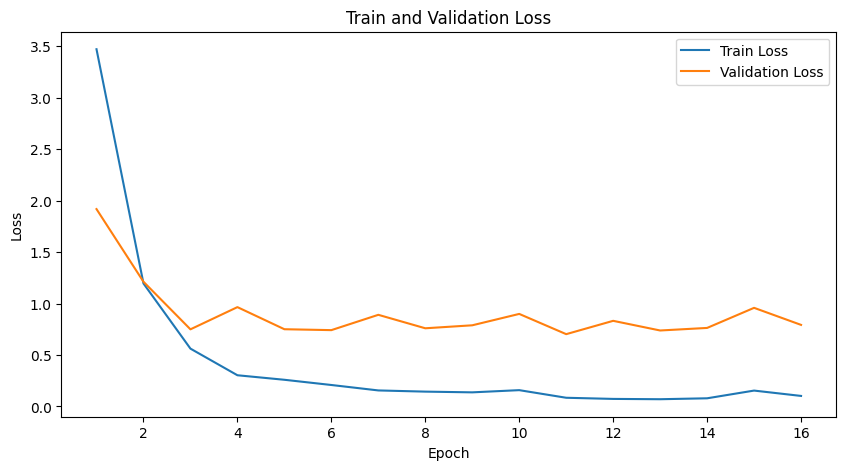

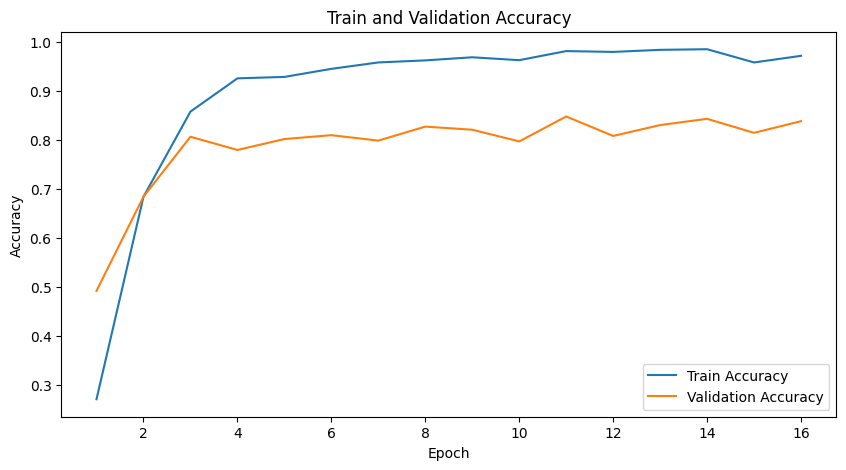

In [63]:
# 시각화 - 손실 그래프
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Validation Loss')
plt.legend()
plt.show()

# 시각화 - 정확도 그래프
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label='Train Accuracy')
plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train and Validation Accuracy')
plt.legend()
plt.show()

### 학습 예시 상황

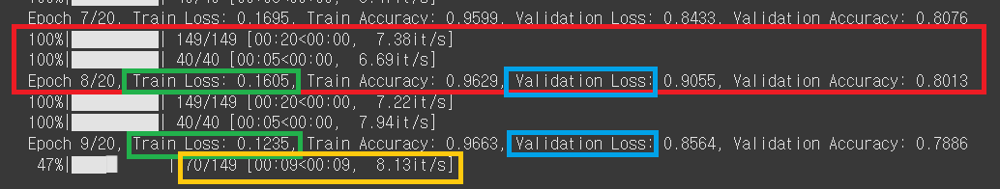

- 149가 train, 40이 valid입니다.
- batch_size를 16으로 했으니까, 전체 train 데이터 2372개를 16개로 나누면 148.25가 나옵니다. 따라서 전체 2372개의 train 데이터를 16개를 한 묶음으로 한 것을 총 149묶음으로 하여 학습한 것을 의미합니다.
- 전체 629개의 valid 데이터는 16개를 한 묶음으로 하여 총 40 묶음으로 검증한 것을 의미합니다.
- 149와 40 batch에 대해 학습과 검증을 하면 epoch 한 번이 끝나고(위의 이미지에서 빨간 부분), 각 Epoch에 대한 Loss와 Accuracy를 출력합니다.
- 149/149 [00:20<00:00]: 149개 중에 149개를 train했고 20초가 걸렸다
- 70/149 [00:09<00:9]: 149개 중에 70개를 train했고 9초가 걸렸으며 나머지 79개를 train하는데 9초가 걸릴 것으로 예상한다 (노랑 부분)

**Insight**
- 위의 학습 상황 예시를 보면, epoch을 지날수록 Train Loss와 Validation Loss가 줄어드는 것을 확인할 수 있습니다.
- 이때, Train Loss는 epoch을 반복할수록 줄어드는데, Validation Loss는 학습 중간에 오히려 커지는 상황이 발생합니다. 이것이 바로 **과적합**입니다.

*이탤릭체 텍스트*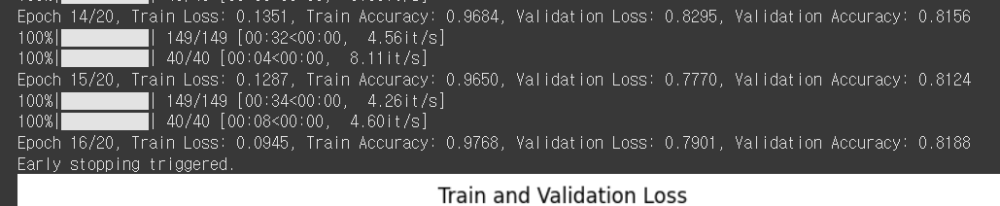

- 저의 경우에는 epoch 16까지 학습하고 조기 종료 조건에 의해 중단됐습니다. <br>
조기종료가 되는지 안 되는지는 개개인마다 다를 수 있어요

## 학습한 모델을 통해 test 데이터셋 평가
- 학습 완료하고 모델 정보를 저장했으면, 그 모델 정보를 불러와서 학습된 모델을 사용할 수 있습니다.

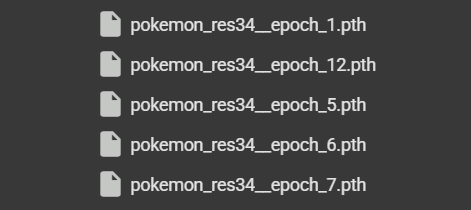

학습이 끝난 후 제 drive 안에는 이런 파일들이 생겼습니다. <br>
만약 pokemon_res34___final_~~.pth 처럼 final이 들어간 파일이 있으시다면 그 파일 쓰시면 돼요<br>
만약 final 파일 없이 저처럼 저렇게만 있다면, 조기종료 된 것이므로 epoch 뒤에 숫자가 제일 큰 파일을 쓰시면 됩니다. 저같은 경우에는 12가 가장 크니까 pokemon_res34__epoch_12.pth를 사용했어요

In [65]:
# 저장한 모델 가중치 로드
load_path = "/content/drive/MyDrive/pokemon_res34__epoch_11.pth"  # 본인 파일의 이름으로 꼭 수정해야 해요
checkpoint = torch.load(load_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

## 성능 지표 계산

In [66]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

all_preds = []
all_labels = []

with torch.no_grad(): # 기울기 계산 안 하게 하는거 어떻게 했죠?
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# 클래스 인덱스 → 클래스 이름 매핑
idx_to_class = {v: k for k, v in class_to_idx.items()}

# 분류 보고서 출력
print(classification_report(all_labels, all_preds, target_names=[idx_to_class[i] for i in range(len(idx_to_class))]))


                  precision    recall  f1-score   support

            Abra       1.00      0.50      0.67         2
      Aerodactyl       1.00      0.50      0.67         2
        Alakazam       0.50      1.00      0.67         1
Alolan Sandslash       0.75      1.00      0.86         3
           Arbok       1.00      1.00      1.00         2
        Arcanine       1.00      1.00      1.00         2
        Articuno       0.67      1.00      0.80         2
        Beedrill       0.00      0.00      0.00         2
      Bellsprout       1.00      0.50      0.67         2
       Blastoise       1.00      0.50      0.67         2
       Bulbasaur       0.80      1.00      0.89         4
      Butterfree       1.00      1.00      1.00         2
        Caterpie       1.00      0.50      0.67         2
         Chansey       1.00      1.00      1.00         2
       Charizard       1.00      1.00      1.00         2
      Charmander       1.00      1.00      1.00         4
      Charmel

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


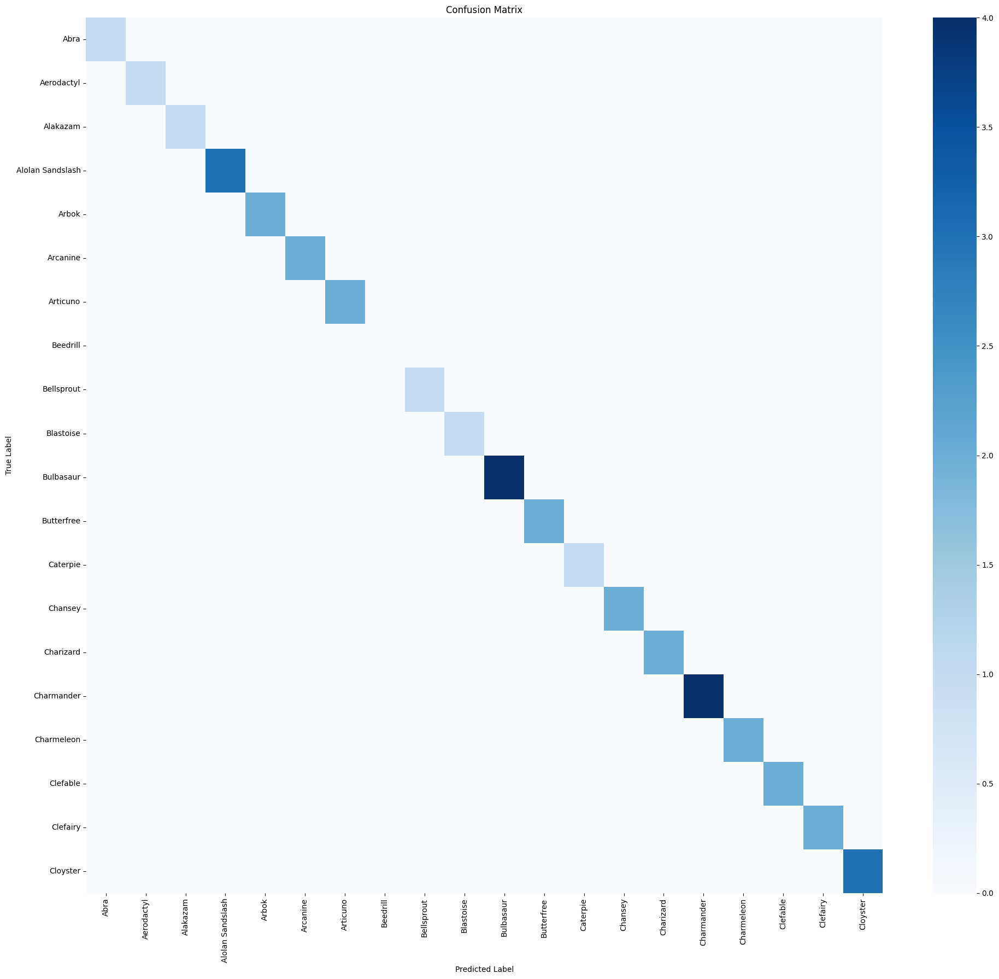

In [67]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# all_preds, all_labels는 이미 생성된 상태라고 가정
cm = confusion_matrix(all_labels, all_preds)

# 클래스 이름 (정렬된 인덱스 순서)
class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

# 150개 너무 많으니까 상위 N개 클래스만 볼게요
N = 20
cm = cm[:N, :N]
class_names = class_names[:N]

plt.figure(figsize=(20, 18))
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


## test 데이터셋에서 예측값과 정답 시각화로 비교

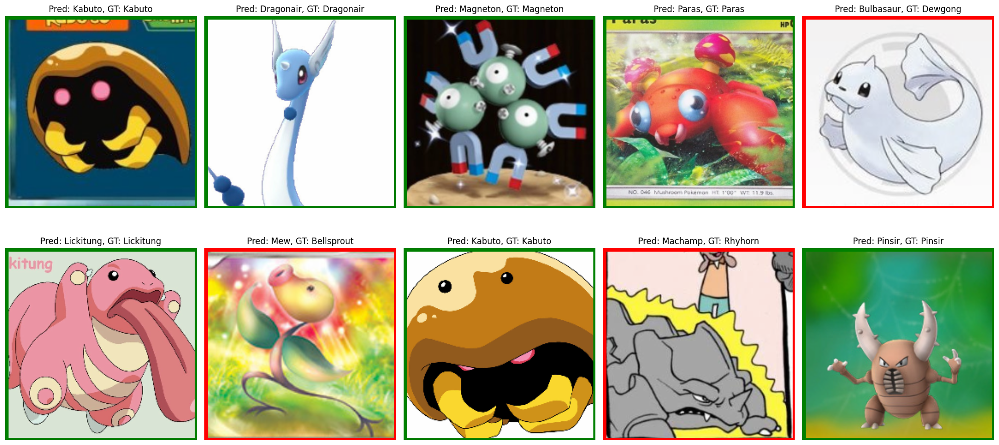

In [68]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# 시각화 설정
model.eval()
fig, axes = plt.subplots(2, 5, figsize=(20, 10))  # 2행 5열 subplot
axes = axes.ravel()

random_indices = random.sample(range(len(test_dataset)), 10)

for i, idx in enumerate(random_indices):
    image, label = test_dataset[idx]  # image: tensor, label: int
    input_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        pred = torch.argmax(output, dim=1).item()

    # 클래스 이름 매핑
    pred_class = idx_to_class[pred]
    gt_class = idx_to_class[label.item()]

    # 이미지 처리: CHW → HWC, unnormalize
    image_np = image.permute(1, 2, 0).cpu().numpy()
    image_np = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    image_np = np.clip(image_np, 0, 1)

    axes[i].imshow(image_np)
    axes[i].axis("off")
    axes[i].set_title(f"Pred: {pred_class}, GT: {gt_class}")

    # 테두리 색상: 정답이면 초록, 오답이면 빨강
    color = "green" if pred == label else "red"
    h, w, _ = image_np.shape
    rect = patches.Rectangle((0, 0), w, h, linewidth=8, edgecolor=color, facecolor='none')
    axes[i].add_patch(rect)

plt.tight_layout()
plt.show()


---
# Part 3. 비교 분석 및 정리 📊

## 3-1. 이진 분류 vs 다중 분류

### 주요 차이점

| 구분 | 이진 분류 (Cats vs Dogs) | 다중 분류 (Pokemon) |
|------|-------------------------|--------------------|
| **클래스 수** | 2개 | 여러 개 |
| **출력 레이어** | 1개 노드 | 클래스 수만큼의 노드 |
| **활성화 함수** | Sigmoid | Softmax |
| **손실 함수** | BCELoss | CrossEntropyLoss |
| **예측값** | 0~1 사이 확률 | 각 클래스별 확률 |
| **레이블 형식** | 0 또는 1 | 클래스 인덱스 (0, 1, 2, ...) |

### 언제 어떤 것을 사용하나?

- **BCELoss**: 정확히 2개 클래스를 구분할 때
- **CrossEntropyLoss**: 2개 이상의 클래스를 구분할 때 (이진 분류도 가능)

## 3-2. 직접 구현 vs Transfer Learning

### 직접 구현 (AlexNet - Part 1)

**장점**:
- CNN 구조를 깊이 이해할 수 있음
- 모델을 완전히 제어 가능
- 특수한 도메인에 맞춤 설계 가능

**단점**:
- 학습에 많은 시간과 데이터 필요
- 최적화가 어려움
- 처음부터 특징을 학습해야 함

### Transfer Learning (ResNet - Part 2)

**장점**:
- 빠른 학습과 높은 성능
- 적은 데이터로도 좋은 결과
- 검증된 아키텍처 활용

**단점**:
- 모델 구조 이해가 상대적으로 어려움
- 큰 모델은 메모리를 많이 사용
- 도메인이 너무 다르면 효과가 제한적

### 실전 팁

1. **데이터가 적을 때**: Transfer Learning 추천
2. **데이터가 많을 때**: 직접 구현 또는 Fine-tuning
3. **빠른 프로토타입**: Transfer Learning
4. **학습 목적**: 직접 구현으로 시작

## 3-4. 실습 요약

### Part 1: Cats vs Dogs (이진 분류)
- ✅ CNN 모델 직접 구현 (AlexNet)
- ✅ albumentations 데이터 증강
- ✅ BCELoss 사용한 이진 분류
- ✅ 성능 평가 및 시각화

### Part 2: Pokemon (다중 분류)
- ✅ Transfer Learning (ResNet18)
- ✅ CrossEntropyLoss 사용한 다중 분류
- ✅ Confusion Matrix 분석
- ✅ 클래스별 성능 평가

### Part 3: 비교 및 정리
- ✅ 이진 vs 다중 분류 비교
- ✅ 직접 구현 vs Transfer Learning 비교
- ✅ 성능 개선 기법

---

## 🎉 과제 완료!

수고하셨습니다! CNN을 활용한 이미지 분류의 기초부터 실전까지 모두 학습하셨습니다.